Nama : Enjel Lyka Siahaan

NIM  : 20/456739/TK/50563

PRAKTIKUM ANALISIS CITRA PENGINDERAAN JAUH

In [43]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Latihan 1: Menggunakan Corner Detector

jumlah titik terdeteksi =  667


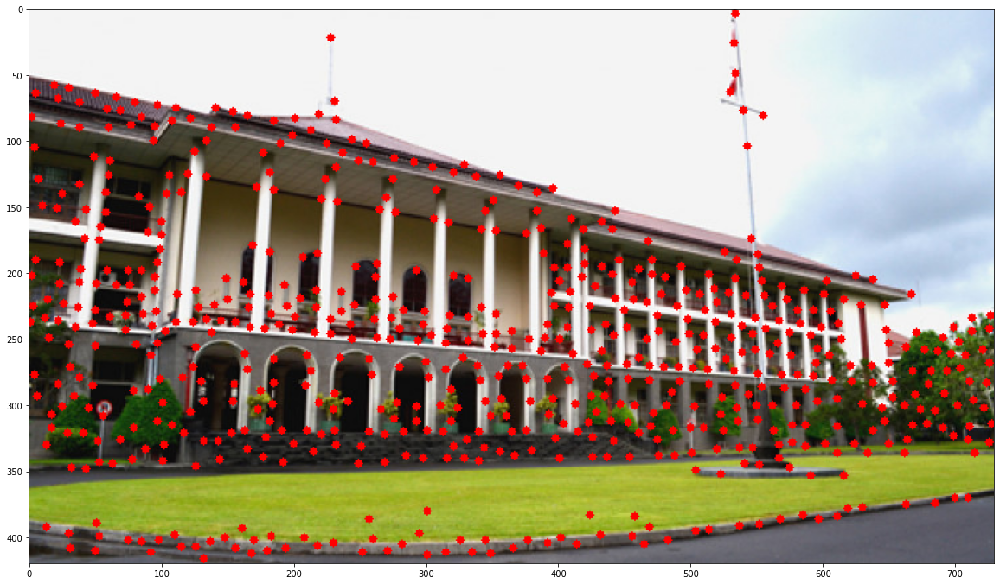

(<matplotlib.image.AxesImage at 0x7f01295b3490>, None)

In [47]:
# Menggunakan Shi-Tomasi GFTT untuk deteksi ujung (corner detection)

import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

# gunakan gambar yang disediakan di eLOK
img = cv2.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/gedungpusat.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY) 


# deteksi pojok dengan GFTT
corners = cv2.goodFeaturesToTrack(gray,1000,0.01,10)
corners = np.int0(corners)

# menampilkan jumlah titik terdeteksi dengan fungsi numpy (np.ndarray.shape)
print("jumlah titik terdeteksi = ", corners.shape[0])

# untuk ditampilkan di Matplotlib, urutan band dibalik
rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

# perbesar ukuran hasil plotting 
plt.rcParams["figure.figsize"] = (20,20)

# untuk tiap pojok yang terdeteksi, munculkan pada gambar
for i in corners:
    x,y = i.ravel()
    cv2.circle(rgb,(x,y),3,255,-1)
plt.imshow(rgb),plt.show()

- Deteksi Corner Detector menggunakan harris







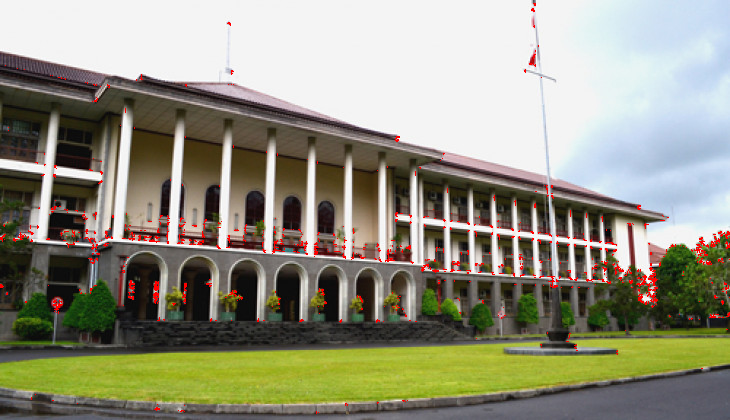

In [53]:
# Import library
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image
img = cv2.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/gedungpusat.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Set Harris corner detector parameters
block_size = 2
ksize = 3
k = 0.04

# Apply Harris corner detector
corners = cv2.cornerHarris(gray, block_size, ksize, k)

# Threshold corner response
threshold = 0.01 * corners.max()
corners_mask = np.zeros_like(corners)
corners_mask[corners > threshold] = 255

# Display corner points on the image
img[corners_mask == 255] = [0, 0, 255]
cv2_imshow(img)

2. Deteksi feature detector dengan KAZE

jumlah titik terdeteksi =  1789


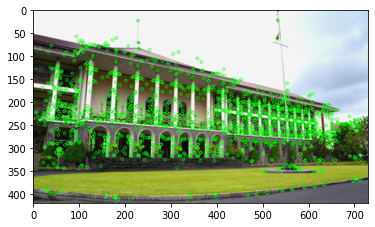

(<matplotlib.image.AxesImage at 0x7f012d9ebf10>, None)

In [28]:
# Mendownload gambar Lenna untuk contoh
#!wget https://pns2019.github.io/images/Lenna.png

import cv2
import numpy as np

# memanggil gambar berwarna
img = cv2.imread('gedungpusat.jpg')

# cara lain memanggil grayscale dari gambar
#img = cv2.imread('gedungpusat.jpg',0)
gray= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# mendefinisikan KAZE descriptor
kaze = cv2.KAZE_create()
kp = kaze.detect(gray)

#kps = sorted(kp, key=lambda x: -x.response)[:32]

# computing descriptors vector
kp, dsc = kaze.compute(gray, kp)

# berapa titik yang terdeteksi?
print("jumlah titik terdeteksi = ", len(kp))

# menggambar keypoint yang berhasil diidentifikasi
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2 = cv2.drawKeypoints(img_rgb, kp, None, color=(0,255,0), flags=0)
plt.imshow(img2), plt.show()

- Feature Detector dengan ORB

jumlah titik terdeteksi =  500


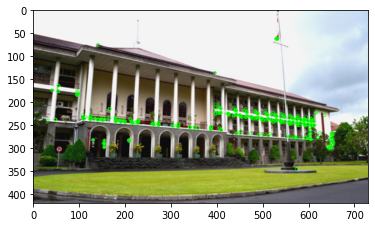

(<matplotlib.image.AxesImage at 0x7f01296ef9a0>, None)

In [29]:
import numpy as np
import cv2 
from matplotlib import pyplot as plt

# membaca citra
img = cv2.imread('gedungpusat.jpg',0)

# membuat ORB detector
orb = cv2.ORB_create()

# kp: variabel untuk menyimpan keypoint yang berhasil dideteksi
kp = orb.detect(img,None)

# menghitung deskriptor
# kp = keypoints
# des = descriptor
kp, des = orb.compute(img, kp)

# berapa jumlah titik terdeteksi?
print("jumlah titik terdeteksi = ", len(kp))

# menggambar keypoint yang berhasil diidentifikasi 
img2 = cv2.drawKeypoints(img_rgb, kp, None, color=(0,255,0), flags=0)  # img_rbg dari variabel sebelumnya di atas
plt.imshow(img2), plt.show()


3. Algoritma SIFT

In [34]:
# cek versi opencv sekarang 
import cv2
print(cv2.__version__)

4.6.0


jumlah titik terdeteksi=  1853


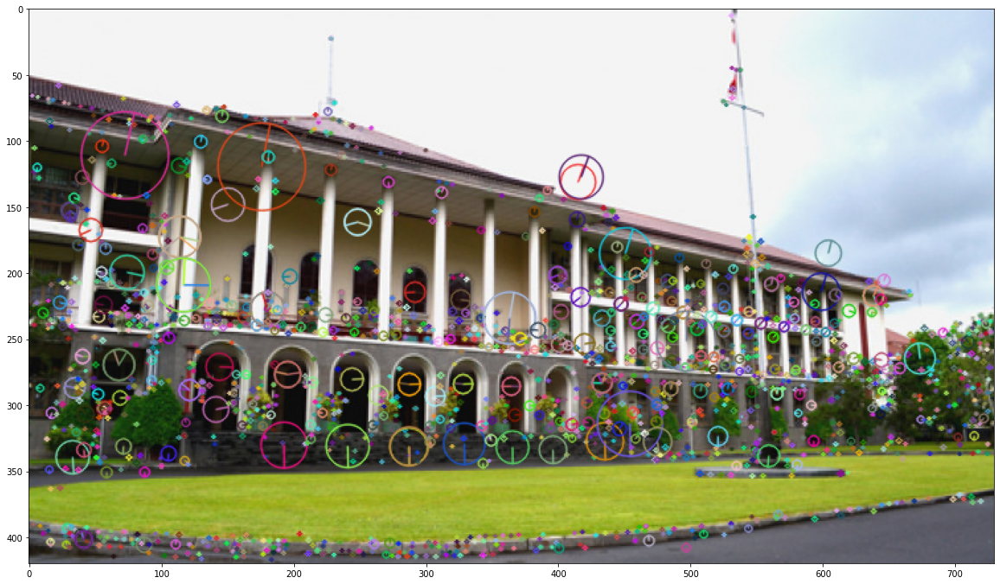

(<matplotlib.image.AxesImage at 0x7f0129672bb0>, None)

In [35]:
import cv2
from matplotlib import pyplot as plt

img = cv2.imread('gedungpusat.jpg')
# konversi ke warna abu2 agar menjadi satu band
gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# menghitung fitur dengan SIFT
sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(gray, None)

# berapa jumlah titik terdeteksi?
print("jumlah titik terdeteksi= ", len(kp))

# perbesar ukuran hasil plotting 
plt.rcParams["figure.figsize"] = (20,20)

# menggambar keypoint yang berhasil diidentifikasi 
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img3 =cv2.drawKeypoints(img_rgb,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img3), plt.show()

- Metode dengan Feature Matching

In [62]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

# gunakan gambar yang disediakan di eLOK
img = cv2.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/webarebears.jpg')

In [63]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

# gunakan gambar yang disediakan di eLOK
img2 = cv2.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/ice_bear.jpg')

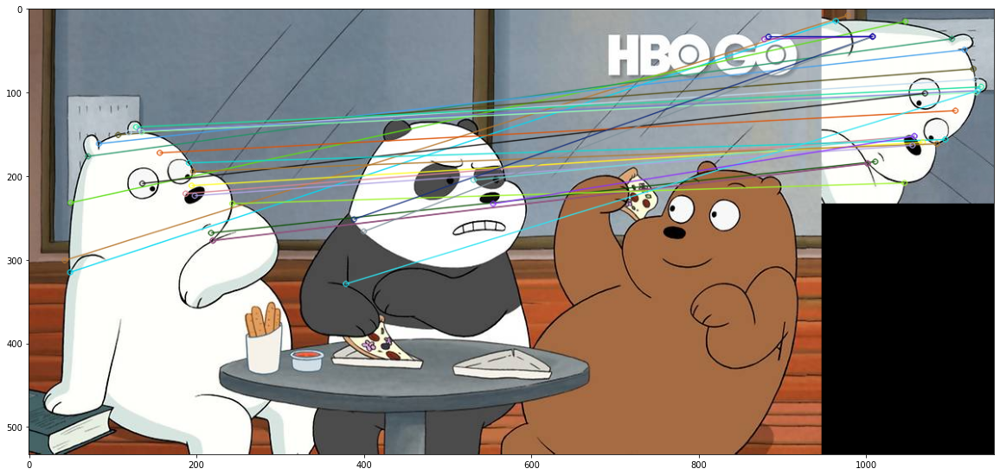

(<matplotlib.image.AxesImage at 0x7f012954bbe0>, None)

In [64]:
# Contoh Script untuk feature detection and Matching
# Modifikasi script ini untuk mencoba metode yang berbeda 

import numpy as np
import cv2
from matplotlib import pyplot as plt

# Gunakan gambar dari eLOK
img1 = cv2.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/webarebears.jpg')          # gambar yang dituju
img2 = cv2.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/ice_bear.jpg')             # gambar yang dicari
gray1= cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
gray2= cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

# Menggunakan Detector SIFT
sift = cv2.xfeatures2d.SIFT_create()

# Mencari Keypoint dengan SIFT
kp1, des1 = sift.detectAndCompute(gray1,None)
kp2, des2 = sift.detectAndCompute(gray2,None)

# Melakukan Matching dari hasil deteksi keypoints menggunakan
# BruteForce Matcher
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Uji rasio matching sederhana
good = []
for m,n in matches:
    if m.distance < 0.5*n.distance:
        good.append([m])
img3 = None

# menggambar hasil match pada gambar baru (IMG3)
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,img3,flags=2)
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)),plt.show()

Feature Detection and Matching dengan Brute-Force Matching

In [65]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
img1 = cv.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/webarebears.jpg',cv.IMREAD_GRAYSCALE)          # queryImage
img2 = cv.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/ice_bear.jpg',cv.IMREAD_GRAYSCALE) # trainImage
# Initiate ORB detector
orb = cv.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

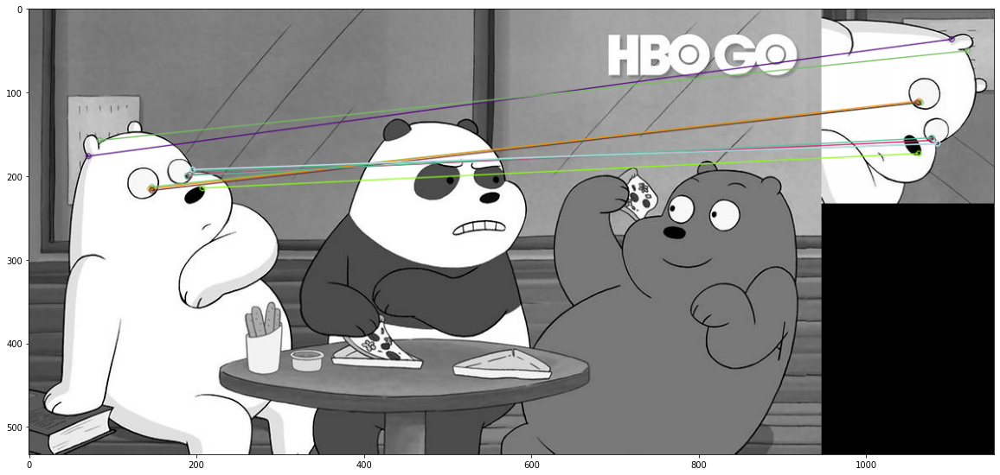

(<matplotlib.image.AxesImage at 0x7f01294a3d60>, None)

In [66]:
# create BFMatcher object
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
# Match descriptors.
matches = bf.match(des1,des2)
# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)
# Draw first 10 matches.
img3 = cv.drawMatches(img1,kp1,img2,kp2,matches[:10],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3),plt.show()

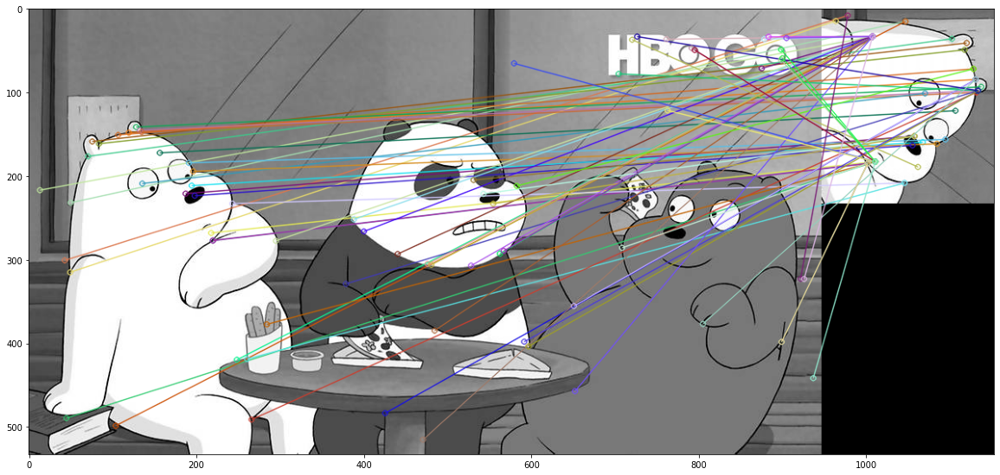

(<matplotlib.image.AxesImage at 0x7f0129490970>, None)

In [67]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
img1 = cv.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/webarebears.jpg',cv.IMREAD_GRAYSCALE)          # queryImage
img2 = cv.imread('/content/drive/MyDrive/PRAK.ACPJ/M4/ice_bear.jpg',cv.IMREAD_GRAYSCALE) # trainImage
# Initiate SIFT detector
sift = cv.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)
# BFMatcher with default params
bf = cv.BFMatcher()
matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])
# cv.drawMatchesKnn expects list of lists as matches.
img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3),plt.show()

-flan

In [68]:
# upload file yang sudah diunduh
# file akan disimpan sesuai dengan nama file yang diunggah
from google.colab import files
file = files.upload()

Saving solvayconference.jpg to solvayconference.jpg


In [70]:
# upload file yang sudah diunduh
# file akan disimpan sesuai dengan nama file yang diunggah
from google.colab import files
file = files.upload()

Saving einstein.png to einstein.png


In [69]:
!ls

 7GG30qd	       'gedungpusat (5).jpg'   Lenna.png.2
 bo-museum-gesat        gedungpusat.jpg        sample_data
 drive		       'ice_bear (1).jpg'      solvayconference.jpg
'gedungpusat (1).jpg'   ice_bear.jpg	      'webarebears (1).jpg'
'gedungpusat (2).jpg'   kastil.jpg	       webarebears.jpg
'gedungpusat (3).jpg'   Lenna.png
'gedungpusat (4).jpg'   Lenna.png.1


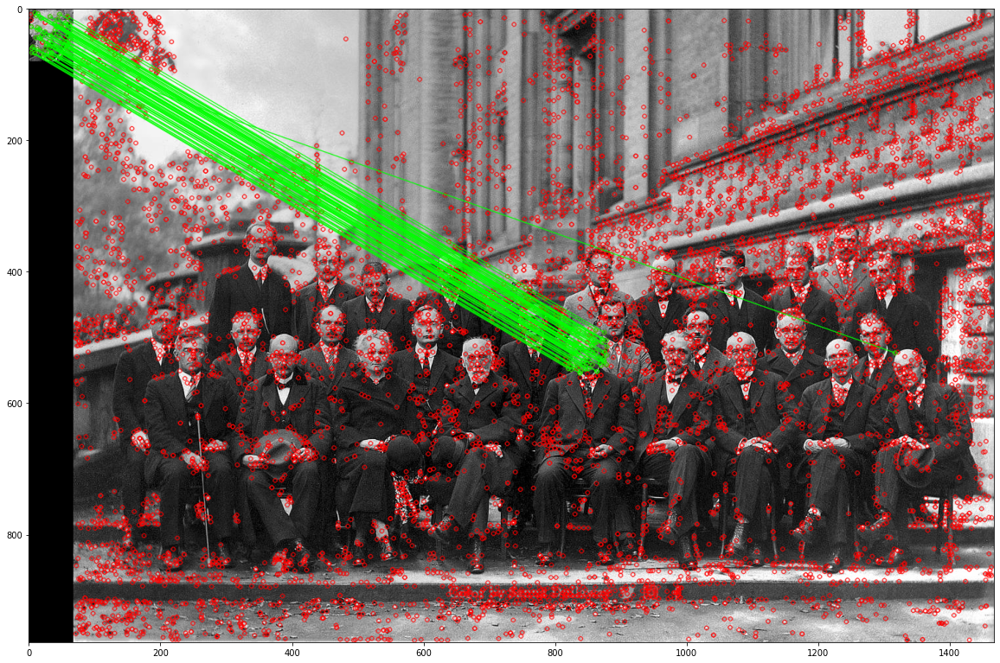

(<matplotlib.image.AxesImage at 0x7f01293c2d30>, None)

In [73]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
img1 = cv.imread('einstein.png',cv.IMREAD_GRAYSCALE)          # queryImage
img2 = cv.imread('solvayconference.jpg',cv.IMREAD_GRAYSCALE) # trainImage
# Initiate SIFT detector
sift = cv.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)
# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1,des2,k=2)
# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.7*n.distance:
        matchesMask[i]=[1,0]
draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = cv.DrawMatchesFlags_DEFAULT)
img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,**draw_params)
plt.imshow(img3,),plt.show()

- Template Matching

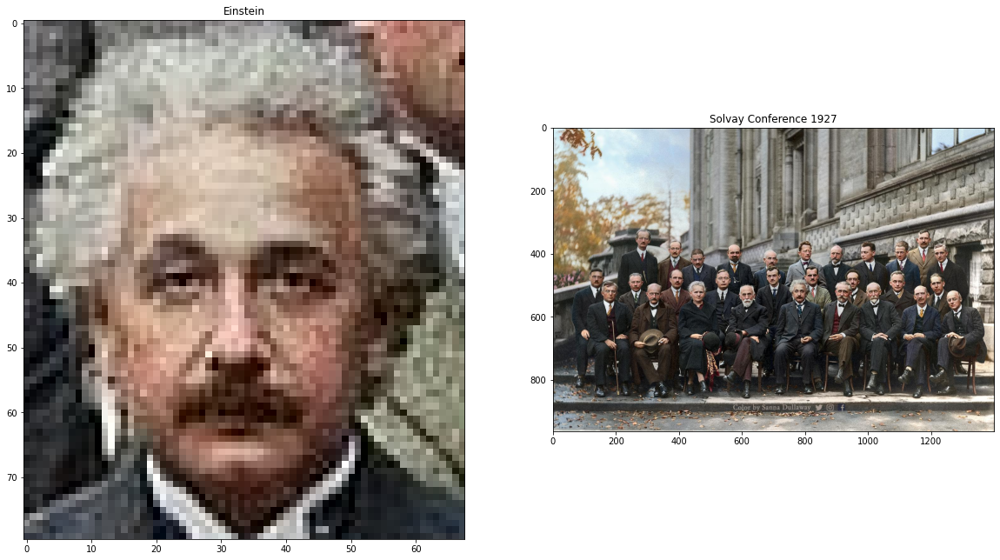

In [74]:
# tampilkan kedua gambar
from matplotlib import pyplot as plt

# panggil dan konversi warna agar sesuai dengan Matplotlib
einstein = cv2.imread('einstein.png')
einstein =  cv2.cvtColor(einstein, cv2.COLOR_BGR2RGB) # simpan dengan nama yang sama = ditumpuk

# panggil dan konversi warna agar sesuai dengan Matplotlib
solvay = cv2.imread('solvayconference.jpg')
solvay =  cv2.cvtColor(solvay, cv2.COLOR_BGR2RGB) 

plt.subplot(121),plt.imshow(einstein), plt.title('Einstein')
plt.subplot(122),plt.imshow(solvay), plt.title('Solvay Conference 1927')
plt.show()

Mencari Sample 

hasil metode cv2.TM_CCOEFF : 


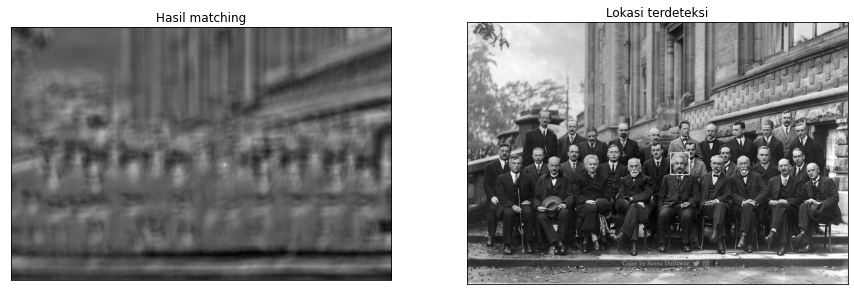

hasil metode cv2.TM_CCOEFF_NORMED : 


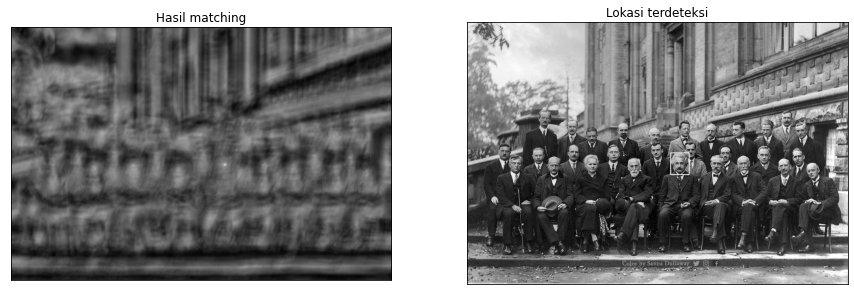

hasil metode cv2.TM_CCORR : 


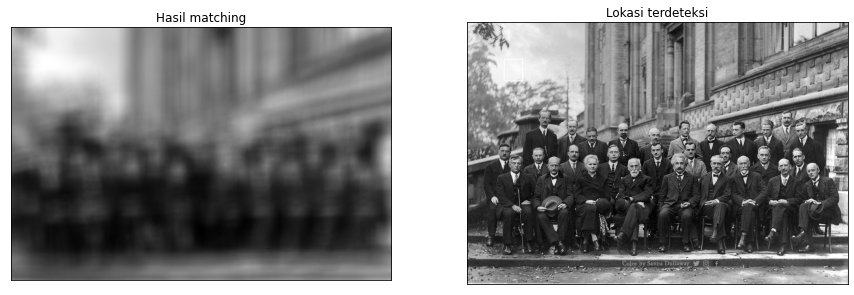

hasil metode cv2.TM_CCORR_NORMED : 


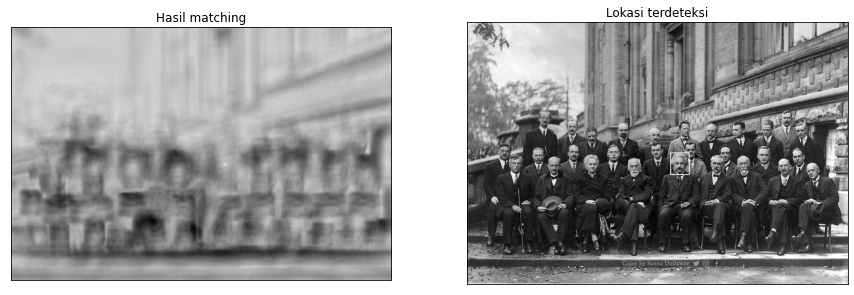

hasil metode cv2.TM_SQDIFF : 


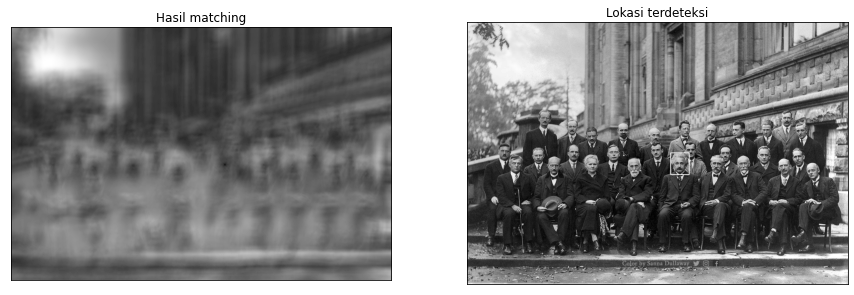

hasil metode cv2.TM_SQDIFF_NORMED : 


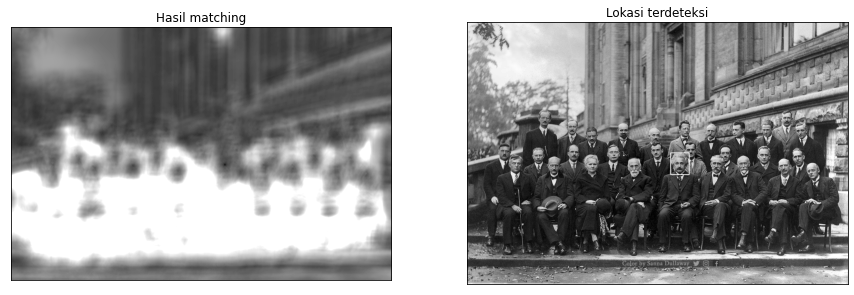

In [76]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('solvayconference.jpg',0)
img2 = img.copy()
template = cv2.imread('einstein.png',0)
w, h = template.shape[::-1]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

# perbesar ukuran hasil plotting 
plt.rcParams["figure.figsize"] = (15,15)

for met in methods:
    img = img2.copy()
    method = eval(met)

    # menggunakan template matching
    res = cv2.matchTemplate(img,template,method)

    # mencari ukuran citra template untuk menggambar kotak
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # metode TM_SQDIFF dan TM_SQDIFF_NORMED menggunakan persamaan yang sedikit berbeda
    # sehingga dibuatkan fungsi khusus untuk mengambil nilai minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    
    
    # buat persegi pada lokasi yang ditemukan
    cv2.rectangle(img, top_left, bottom_right, 255, 2) # 2 adalah ketebalan garis kotak

    print("hasil metode", met, ": " )
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Hasil matching'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Lokasi terdeteksi'), plt.xticks([]), plt.yticks([])
    

    plt.show()

Deteksi Jumlah Pohon Sawit

In [77]:
# upload file yang sudah diunduh
# file akan disimpan sesuai dengan nama file yang diunggah
from google.colab import files
file = files.upload()

Saving sawit.png to sawit.png


In [78]:
# upload file yang sudah diunduh
# file akan disimpan sesuai dengan nama file yang diunggah
from google.colab import files
file = files.upload()

Saving plantation.jpg to plantation.jpg


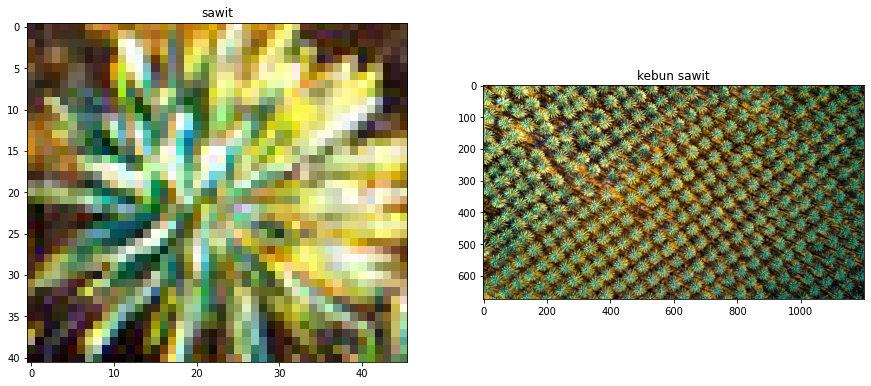

In [79]:
# tampilkan kedua gambar
from matplotlib import pyplot as plt

# panggil dan konversi warna agar sesuai dengan Matplotlib
sawit = cv2.imread('sawit.png')
sawit =  cv2.cvtColor(sawit, cv2.COLOR_BGR2RGB)

# panggil dan konversi warna agar sesuai dengan Matplotlib
kebun_sawit = cv2.imread('plantation.jpg')
kebun_sawit =  cv2.cvtColor(kebun_sawit, cv2.COLOR_BGR2RGB) 

plt.subplot(121),plt.imshow(sawit), plt.title('sawit')
plt.subplot(122),plt.imshow(kebun_sawit), plt.title('kebun sawit')
plt.show()

Menentukan kemiripan keypoint yang ingin di deteksi

In [80]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

## membaca gambar utuh untuk dicari
img_rgb = cv2.imread('plantation.jpg')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

## membaca template 
template = cv2.imread('sawit.png',0)

## ukuran template. ukuran ini akan digunakan untuk menggambar kotak
w, h = template.shape[::-1]

# menggunakan metode COEFF-NORMALIZED
res = cv2.matchTemplate(img_gray,template,cv2.TM_CCOEFF_NORMED)

# Nilai threshold atau ambang batas deteksi kemiripan titik. 
# Lakukan eksperimen dengan merubah nilai ini
threshold = 0.15
loc = np.where(res >= threshold)

## membuat array kosong untuk menyimpan lokasi-lokasi dari hasil deteksi
lspoint=[]
lspoint2=[]
count = 0  # untuk menyimpan jumlah matching yang ditemukan
for pt in zip(*loc[::-1]):
	## jika sudah ada, skip lokasi tersebut
	if pt[0] not in lspoint and pt[1] not in lspoint2:
		## gambar persegi warna kuning dengan ketebalan dua poin
		cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,255,255), 2)
		for i in range(((pt[0])-9), ((pt[0])+9),1):
			## tambahkan koordinat x ke list
			lspoint.append(i)
		for k in range(((pt[1])-9), ((pt[1])+9),1):
			## tambahkan koordinat y ke list
			lspoint2.append(k)
		count+=1 ### berapa jumlah matching yang ditemukan?
	else:
		continue
print ("Jumlah objek ditemukan ", count)

## tampilkan dengan imshow	
cv2_imshow(img_rgb)

Output hidden; open in https://colab.research.google.com to view.